# Предсказание степени загрязненности воды <br>и классификация грязной/чистой воды

Набор данный представляет выборку оценок степени загрязнённости воды в Европейских странах за период между 1991 и 2017 годами. Кроме оценок самого целевого показателя (загрязненность) набор содержит ряд первичных данных, например, содержание пластика, скорость потока, географическое место измерений, число туристов и т.д. Цель этого набора данных - построить модель предсказания численных оценок загрязненности воды по первичным показателям, а также построить модель классификации загрязненности по тем же показателям. Отметим, что набор данных представляет собой переработанную задачу, доступную по следующей ссылке: https://www.kaggle.com/adityakadiwal/water-potability/code

# Импорт и загрузка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import seaborn as sns
import xgboost as xg

import warnings
warnings.filterwarnings('ignore')
import os

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE 
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_curve, roc_auc_score, mean_squared_error as MSE, log_loss,r2_score

In [3]:
pwd = os.getcwd()
os.listdir(pwd)

['.ipynb_checkpoints',
 'Car Moldova pt1-2.ipynb',
 'Car Moldova pt1-3.ipynb',
 'cars_moldova.csv',
 'lab1,2.ipynb',
 'lab3,4.ipynb',
 'lab5,6.ipynb',
 'lecture 1.pptx',
 'lecture 2.pptx',
 'water-quality_balance.ipynb',
 'waterPollution.csv',
 'water_polution.csv',
 'Лекция 3.pptx']

## Взгляним на данные 

In [4]:
df = pd.read_csv(os.path.join(pwd,'water_polution.csv'))
df = df.drop(columns=['Unnamed: 0'])
df.tail()

,code,Uom,year,period,polution,id,Country,population,tourists,venue,rate,food,glass,metal,other,paper,plastic,leather,green_waste,waste_recycling
19916,CAS_14797-65-0,mg{NO2}/L,2009,2009-01--2009-12,0.092466,FRHR239,France,122.299437,71176346.0,0.0,0.0,32.0,10.0,3.0,26.0,20.0,9.0,0.0,0.0,22.26
19917,EEA_3131-01-9,%,2009,2009-01--2009-12,89.908300,FRHR239,France,122.299437,71176346.0,0.0,0.0,32.0,10.0,3.0,26.0,20.0,9.0,0.0,0.0,22.26
19918,CAS_14797-55-8,mg{NO3}/L,2009,2009-01--2009-12,18.901608,FRHR241,France,122.299437,71176346.0,0.0,0.0,32.0,10.0,3.0,26.0,20.0,9.0,0.0,0.0,22.26
19919,EEA_3164-08-7,{massRatio},2009,2009-01--2009-12,307.307000,FRHR241,France,122.299437,71176346.0,0.0,0.0,32.0,10.0,3.0,26.0,20.0,9.0,0.0,0.0,22.26
19920,EEA_3152-01-0,[pH],2009,2009-01--2009-12,7.954790,FRHR241,France,122.299437,71176346.0,0.0,0.0,32.0,10.0,3.0,26.0,20.0,9.0,0.0,0.0,22.26


### Вопрос
<b> найдите целевую переменную <br>


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19921 entries, 0 to 19920
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   code             19921 non-null  object 
 1   Uom              19921 non-null  object 
 2   year             19921 non-null  int64  
 3   period           19921 non-null  object 
 4   polution         19921 non-null  float64
 5   id               19921 non-null  object 
 6   Country          19921 non-null  object 
 7   population       19814 non-null  float64
 8   tourists         19814 non-null  float64
 9   venue            19921 non-null  float64
 10  rate             19814 non-null  float64
 11  food             19814 non-null  float64
 12  glass            19814 non-null  float64
 13  metal            19814 non-null  float64
 14  other            19814 non-null  float64
 15  paper            19814 non-null  float64
 16  plastic          19814 non-null  float64
 17  leather     

### Вопрос:
<b> найдите тип данных категориальных переменных <br>


### Посчитаем число численных и категориальных колонок 

In [20]:
cat_columns = []
num_columns = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns +=[column_name]
    else:
        num_columns +=[column_name]

print('categorical columns:\t ',cat_columns, '\n len = ',len(cat_columns))

print('numerical columns:\t ',  num_columns, '\n len = ',len(num_columns))



categorical columns:	  ['code', 'Uom', 'period', 'id', 'Country'] 
 len =  5
numerical columns:	  ['year', 'polution', 'population', 'tourists', 'venue', 'rate', 'food', 'glass', 'metal', 'other', 'paper', 'plastic', 'leather', 'green_waste', 'waste_recycling'] 
 len =  15


### Вопрос:

<b>Сколько категориальных (калонок с типом <code>object</code>) и сколько численных калонок<br>


### Заполним пропуски в данных (NaN)

In [21]:
df.isna().sum()

code                 0
Uom                  0
year                 0
period               0
polution             0
id                   0
Country              0
population         107
tourists           107
venue                0
rate               107
food               107
glass              107
metal              107
other              107
paper              107
plastic            107
leather            107
green_waste        107
waste_recycling    107
dtype: int64

### Вопрос
<b> сколько значений <code>NaN</code>.<br>


In [22]:
df[df.isnull().any(axis=1)].tail()

,code,Uom,year,period,polution,id,Country,population,tourists,venue,rate,food,glass,metal,other,paper,plastic,leather,green_waste,waste_recycling
18355,EEA_3152-01-0,[pH],2006,2006-01--2006-12,7.451670,UKGB110063041450,None,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18459,CAS_14797-55-8,mg{NO3}/L,2007,2007-01--2007-12,5.454507,UKSC003700,None,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18874,CAS_14797-55-8,mg{NO3}/L,2006,2006-01--2006-12,13.561362,LT150100016,Russia,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18893,CAS_14797-55-8,mg{NO3}/L,2010,2010-01--2010-12,0.197002,UKSC020505,None,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19248,CAS_14265-44-2,mg{P}/L,2008,2008-01--2008-12,0.011500,UKSC010280,None,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# median = df.median()
# df=df.filna(median)
df[num_columns]=df[num_columns].interpolate()
df.isna().sum()

code               0
Uom                0
year               0
period             0
polution           0
id                 0
Country            0
population         0
tourists           0
venue              0
rate               0
food               0
glass              0
metal              0
other              0
paper              0
plastic            0
leather            0
green_waste        0
waste_recycling    0
dtype: int64

# Разведовательный анализ данных

## Численные колонки

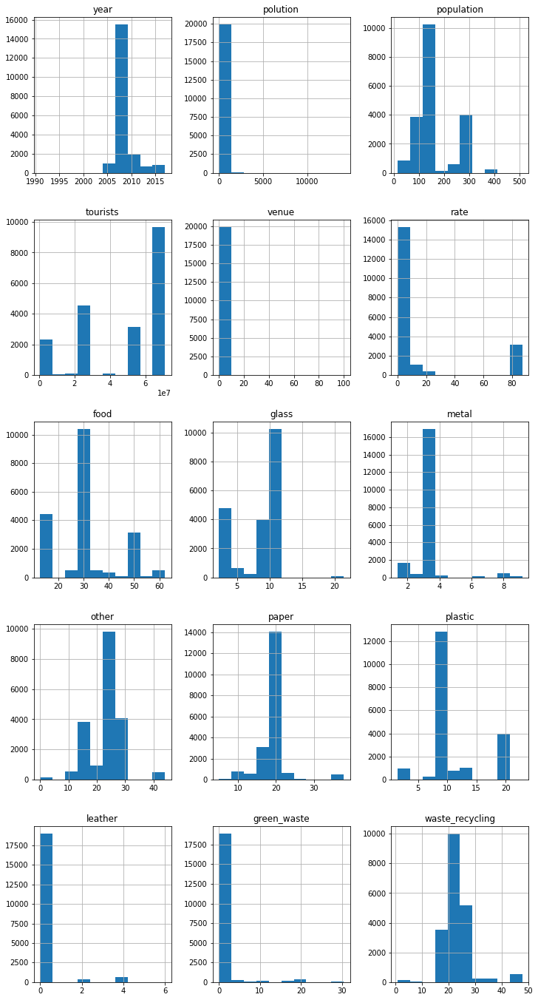

In [11]:
fig, ax = plt.subplots(nrows=len(num_columns)//3, ncols=3, figsize=(12,24))

for idx, column_name in enumerate(num_columns):
    col_idx = idx//3
    row_idx = idx%3
    df.hist(column = [column_name], ax=ax[col_idx,row_idx]);


### Вопрос
<b>
    выдвините свои предположения, касательно того, какие данные можно не учитывать по годам.


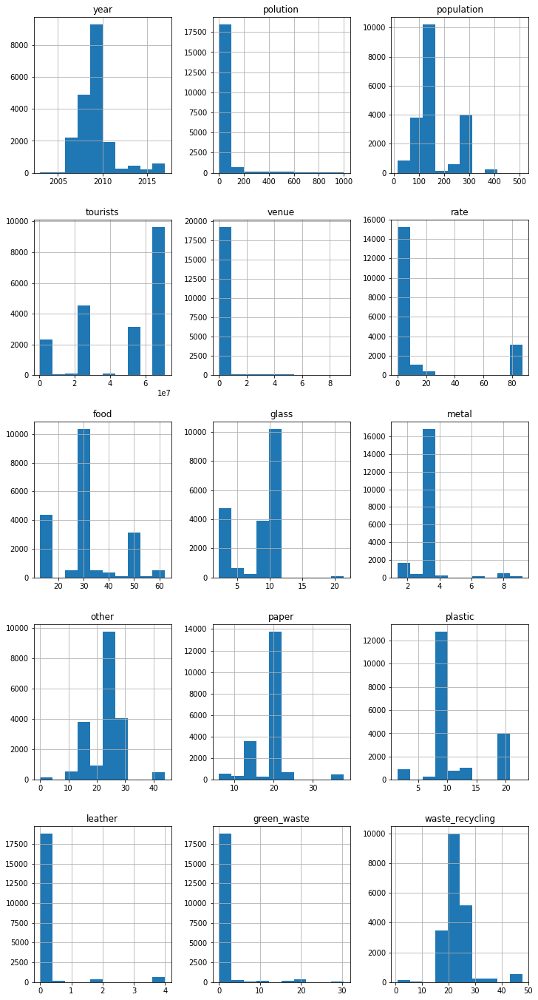

In [12]:
# year
question_year = df[(df.year <2003)]
df = df.drop(question_year.index)

# venue
question_venue = df[(df.venue>10) |(df.venue<0)]
df = df.drop(question_venue.index)

# leather
question_leather = df[(df.leather>5)]
df = df.drop(question_leather.index)

# polution
question_polution = df[(df.polution>1000)]
df = df.drop(question_polution.index)

# test
fig, ax = plt.subplots(nrows=len(num_columns)//3, ncols=3, figsize=(12,24))

for idx, column_name in enumerate(num_columns):
    col_idx = idx//3
    row_idx = idx%3
    df.hist(column = [column_name], ax=ax[col_idx,row_idx]);

### Категориальные колонки

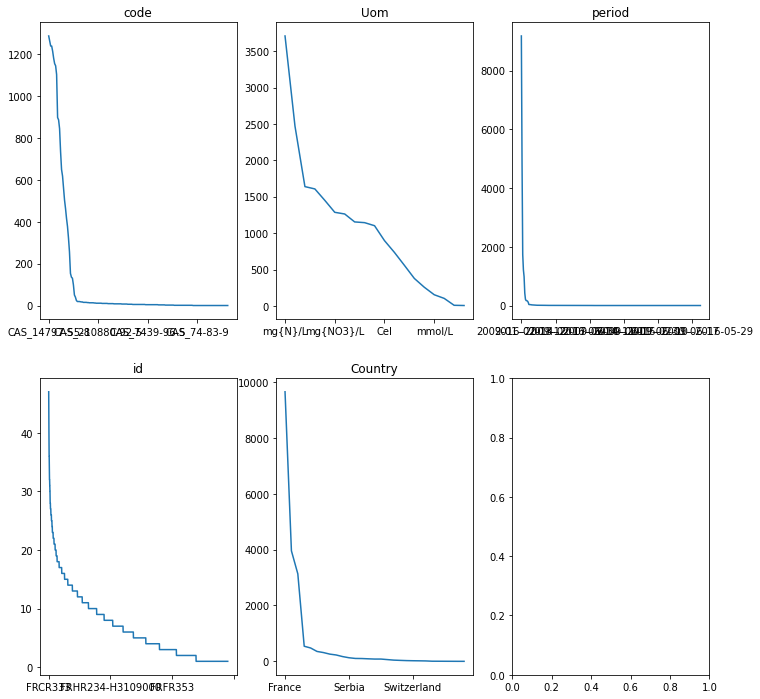

In [26]:
fig, ax = plt.subplots(nrows=int(np.ceil(len(cat_columns)/3)), ncols=3, figsize=(12,12))

for idx, column_name in enumerate(cat_columns):
    col_idx = idx//3
    row_idx = idx%3
    df[column_name].value_counts().plot(ax = ax[col_idx,row_idx], title=column_name)


### Вопрос: 
<b>для какого стоблца точно не следует проводить фильтрации


### Вопрос: 
<b>сколько уникальных значений в столбце <code>Country</code>?


In [27]:
print('id\n',  df.id.value_counts() )

id
 FRCR333                    47
FRDR182                    44
ES030MSPF1005021           43
FRGR0543                   40
ES030MSPF0602021           40
                           ..
FRDR552A                    1
ES030MSPF0529010            1
ES020MSPF000000184          1
CZHSL_1430                  1
ES018MSPFES145MAR000900     1
Name: id, Length: 2906, dtype: int64


In [28]:
def replace2rare(df, column_name, threshold):
    counts = df[column_name].value_counts()
    rare   = counts[(counts.values < threshold)]
    return df[column_name].replace(rare.index.values, 'Rare')

df['code']    = replace2rare(df, 'code',    100)
df['period']  = replace2rare(df, 'period',  500)
df['Country'] = replace2rare(df, 'Country', 1000)
df['Uom']     = replace2rare(df, 'Uom',     100)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19921 entries, 0 to 19920
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   code             19921 non-null  object 
 1   Uom              19921 non-null  object 
 2   year             19921 non-null  int64  
 3   period           19921 non-null  object 
 4   polution         19921 non-null  float64
 5   id               19921 non-null  object 
 6   Country          19921 non-null  object 
 7   population       19921 non-null  float64
 8   tourists         19921 non-null  float64
 9   venue            19921 non-null  float64
 10  rate             19921 non-null  float64
 11  food             19921 non-null  float64
 12  glass            19921 non-null  float64
 13  metal            19921 non-null  float64
 14  other            19921 non-null  float64
 15  paper            19921 non-null  float64
 16  plastic          19921 non-null  float64
 17  leather     

### Вопрос: 
<b>сколько теперь уникальных значений в столбце <code>Country</code>?


In [19]:
for idx, column_name in enumerate(cat_columns):
    print(column_name,': ',  len(df[column_name].value_counts()) )

code :  26
Uom :  18
period :  6
id :  2897
Country :  4


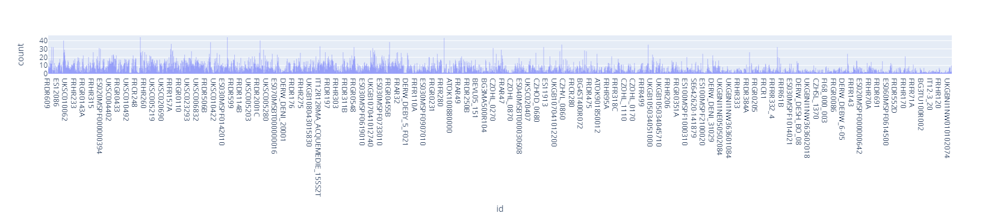

In [20]:
px.histogram(df, x='id',width=600, height=300 )

### Посмотрим на корреляцию колонок

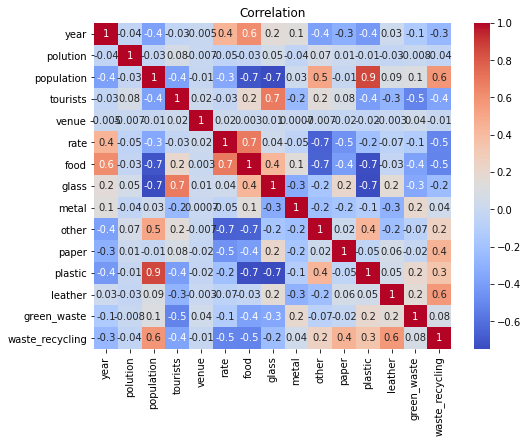

In [21]:
fig, ax = plt.subplots(figsize=(8,6))
plt.title('Correlation')
sns.heatmap(df.corr(), annot=True, fmt='.1g', cmap="coolwarm");

### Вопрос: 
<b>Какие столбцы сильно зависимы судя по корреляционной матрице (порог +-0.8)? 


### Удалим  колонки по корреляции

In [22]:
df = df.drop(columns=['population'])
num_columns.remove('population')

### let's continue analysis

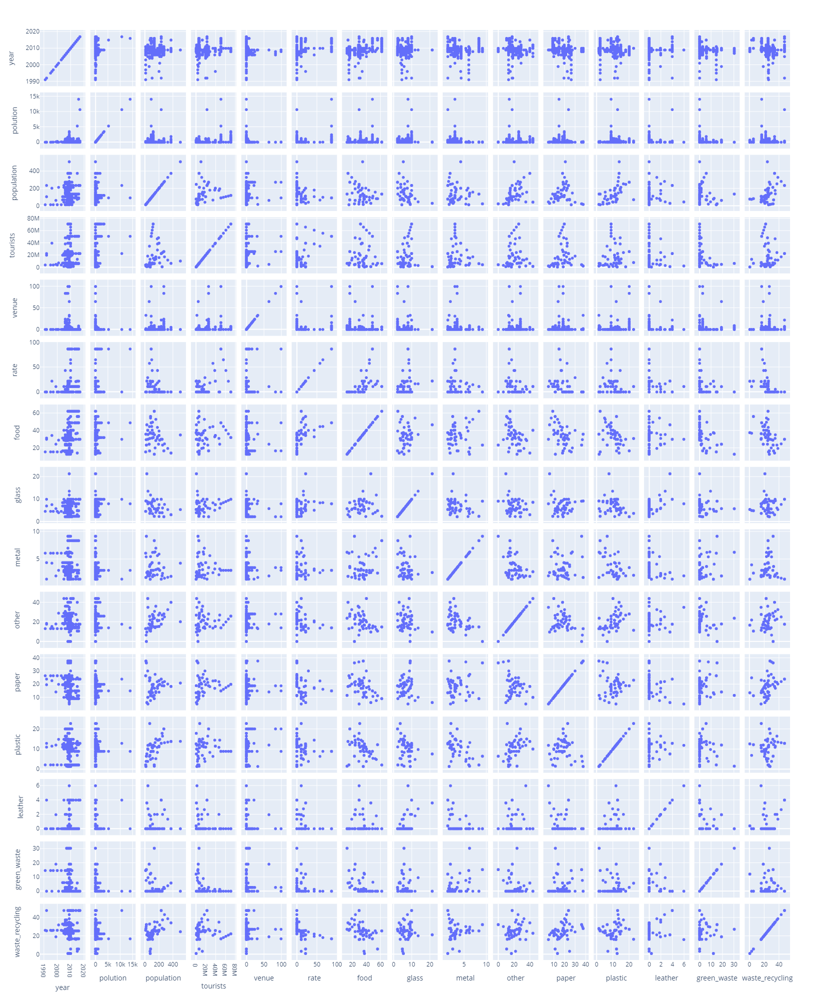

In [29]:
fig = px.scatter_matrix(df[num_columns] ,width=1400, height=2000)
fig.show()

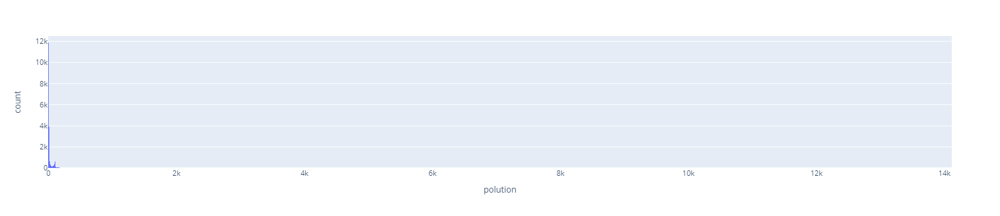

In [30]:
px.histogram(df, x='polution',width=600, height=300 )

## Категориальные данные

### Ручное кодирование

In [31]:
df.Country.value_counts()

France            9653
United Kingdom    3957
Rare              3178
Spain             3133
Name: Country, dtype: int64

In [32]:
df.Country=df.Country.replace({'France':0,'United Kingdom':1,'Rare':2,'Spain':3})
df.Country

0        0
1        0
2        0
3        0
4        3
        ..
19916    0
19917    0
19918    0
19919    0
19920    0
Name: Country, Length: 19921, dtype: int64

### Кодирование пространственное 

In [33]:
df_se = df.copy()
df_se[cat_columns] = df_se[cat_columns].astype('category')

for _, column_name in enumerate(cat_columns):
    df_se[column_name] =  df_se[column_name].cat.codes
df_se.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19921 entries, 0 to 19920
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   code             19921 non-null  int8   
 1   Uom              19921 non-null  int8   
 2   year             19921 non-null  int64  
 3   period           19921 non-null  int8   
 4   polution         19921 non-null  float64
 5   id               19921 non-null  int16  
 6   Country          19921 non-null  int8   
 7   population       19921 non-null  float64
 8   tourists         19921 non-null  float64
 9   venue            19921 non-null  float64
 10  rate             19921 non-null  float64
 11  food             19921 non-null  float64
 12  glass            19921 non-null  float64
 13  metal            19921 non-null  float64
 14  other            19921 non-null  float64
 15  paper            19921 non-null  float64
 16  plastic          19921 non-null  float64
 17  leather     

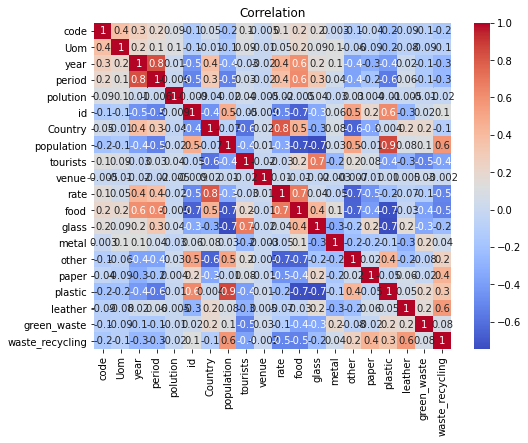

In [34]:
fig, ax = plt.subplots(figsize=(8,6))
plt.title('Correlation')
sns.heatmap(df_se.corr(), annot=True, fmt='.1g', cmap="coolwarm");

### Вопрос: 
<b>Какие столбцы сильно зависимы судя по корреляционной матрице (порог +-0.8)? 


### Можно удалить `period`  из категориальных данных и `rate` или `Country` из сравнения категориальных и численных данных 

In [29]:
df = df.drop(columns=['period','Country'])
cat_columns.remove('period')
cat_columns.remove('Country')

**test**

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19921 entries, 0 to 19920
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   code             19921 non-null  int8   
 1   Uom              19921 non-null  int8   
 2   year             19921 non-null  int64  
 3   period           19921 non-null  int8   
 4   polution         19921 non-null  float64
 5   id               19921 non-null  int16  
 6   Country          19921 non-null  int8   
 7   population       19921 non-null  float64
 8   tourists         19921 non-null  float64
 9   venue            19921 non-null  float64
 10  rate             19921 non-null  float64
 11  food             19921 non-null  float64
 12  glass            19921 non-null  float64
 13  metal            19921 non-null  float64
 14  other            19921 non-null  float64
 15  paper            19921 non-null  float64
 16  plastic          19921 non-null  float64
 17  leather     

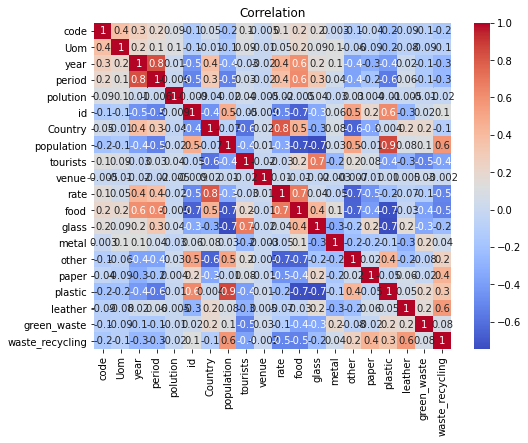

In [35]:
df_se = df.copy()
df_se[cat_columns] = df_se[cat_columns].astype('category')

for _, column_name in enumerate(cat_columns):
    df_se[column_name] =  df_se[column_name].cat.codes
df_se.info()

fig, ax = plt.subplots(figsize=(8,6))
plt.title('Correlation')
sns.heatmap(df_se.corr(), annot=True, fmt='.1g', cmap="coolwarm");

### Вопрос: 
<b>Сколько столбцов осталось после очищения ? 
   

## Проверка на аномалии

<AxesSubplot:>

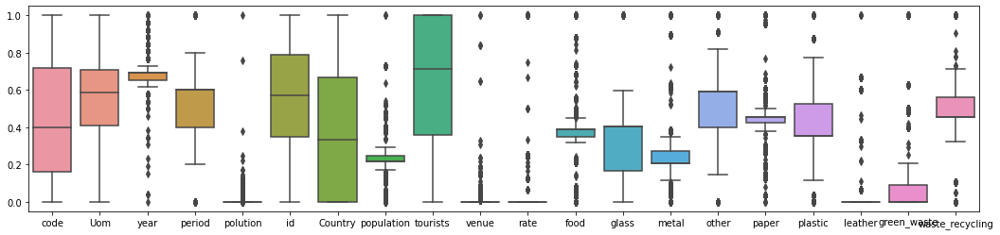

In [36]:
scaler = MinMaxScaler()
x_sacled = scaler.fit_transform(df_se)
df_test = pd.DataFrame(x_sacled, columns = df.columns)
fig = plt.figure(figsize=(18,4))
sns.boxplot(data =df_test,)


### Вопрос: 
<b>назовите столбцы без аномалий? 


аномалий конечно много, даже не знаю, фильтровать ли

### Кодирование one-hot

In [37]:
df_ohe = pd.get_dummies(df)
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19921 entries, 0 to 19920
Columns: 2972 entries, year to id_UKSC023634
dtypes: float64(14), int64(2), uint8(2956)
memory usage: 58.6 MB


### Вопрос: 
<b>Сколько столбцов получилось ? 


# Анализ задач

## Методы без учителя

In [38]:
scaler  = MinMaxScaler()
x_uns = scaler.fit_transform(df_ohe)

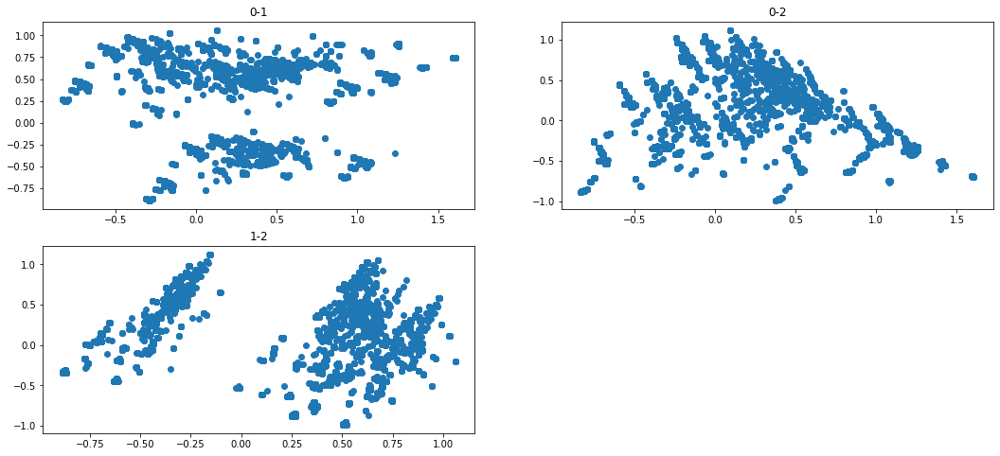

In [39]:
from sklearn.decomposition import PCA
x_pca  = PCA(n_components=3).fit_transform(x_uns)
x_pca.shape

plt.figure(figsize=(18,8))
plt.subplot(221); plt.scatter(x_pca[:,0],x_pca[:,1]); plt.title("0-1")
plt.subplot(222); plt.scatter(x_pca[:,0],x_pca[:,2]); plt.title("0-2")
plt.subplot(223); plt.scatter(x_pca[:,1],x_pca[:,2]); plt.title("1-2")
plt.show();

### Вопрос: 
<b>Сколько кластеров получилось по двум самым главным компонентам  ? 


In [40]:
from sklearn import cluster 

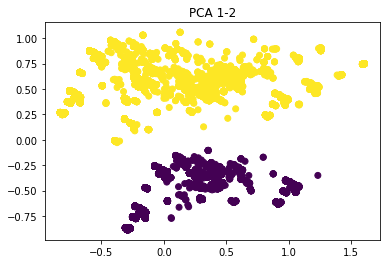

In [41]:
kmeans = cluster.KMeans(n_clusters=2, n_init=100)
kmeans.fit(x_pca[:,:2])
labels = kmeans.predict(x_pca[:,:2])

plt.scatter(x_pca[:,0],x_pca[:,1],  c = labels); 
plt.title("PCA 1-2"); plt.show()

Text(0.5, 1.0, 'polution to year')

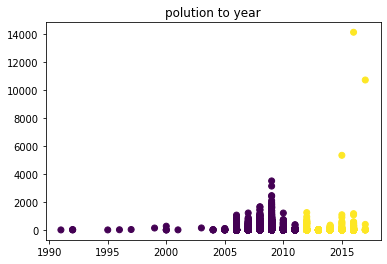

In [42]:
df_test = df[["year","polution"]]

scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_test)


kmeans = cluster.KMeans(n_clusters=2, n_init=100)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.scatter(df_test.iloc[:,0],df_test.iloc[:,1],  c = labels); 
plt.title("polution to year")

### Вопрос: 
<b>Назовите с какого года можно считать, что началась вторая волна загрязнения ? 


Text(0.5, 1.0, 'polution to flow rate')

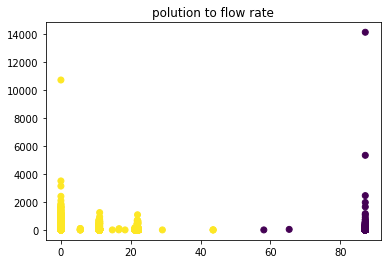

In [43]:
df_test = df[["rate","polution"]]

scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_test)
pd.DataFrame(X_cluster).tail()

kmeans = cluster.KMeans(n_clusters=2, n_init=50)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.scatter(df_test.iloc[:,0],df_test.iloc[:,1],  c = labels); 
plt.title("polution to flow rate")

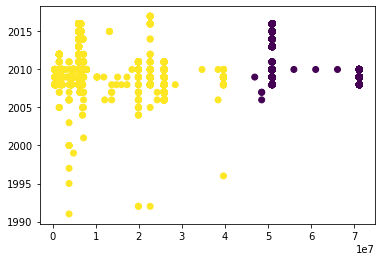

In [44]:
df_test = df[["tourists","year"]]

scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_test)
pd.DataFrame(X_cluster).tail()

kmeans = cluster.KMeans(n_clusters=2, n_init=50)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.scatter(df_test.iloc[:,0],df_test.iloc[:,1],  c = labels); 

## Методы с учителем

Выделем целевую переменную  `polution` как столбец меток

Регрессия

In [46]:
X = df_se.drop(["polution"],axis = 1)
y = df_se["polution"].values 

Классификация

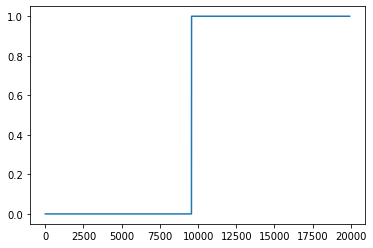

In [47]:
y_cls = (y>=1.7)*1
plt.plot(np.sort(np.copy(y_cls)))

### Вопрос: 
<b>Назовите сбалансированная ли выборка ? 


### Анализ регрессии

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3, random_state = 42)

In [67]:
scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

In [68]:
regressor = xg.XGBRegressor(random_state = 42).fit(X_train,y_train)

In [69]:
print(regressor.score(X_test,y_test), regressor.score(X_train,y_train))

0.7024839260541126 0.9321934262820237


In [70]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators=100, max_depth=50, random_state = 42)
rfr.fit(X_train, y_train)

train_predictions = rfr.predict(X_train)
train_score       = rfr.score(X_train,y_train)

test_predictions = rfr.predict(X_test)
test_score       = rfr.score(X_test,y_test)

print(test_score,train_score)

0.6420104873243557 0.9552781522434877


In [71]:
from sklearn.ensemble import ExtraTreesRegressor
etr = ExtraTreesRegressor(n_estimators=30, random_state = 42)
etr.fit(X_train, y_train)

train_predictions = etr.predict(X_train)
train_score = etr.score(X_train,y_train)

test_predictions = etr.predict(X_test)
test_score = etr.score(X_test,y_test)

print(test_score,train_score)

0.5685611440390161 0.993532964478958


In [72]:
from sklearn.neighbors import KNeighborsRegressor

knnr = KNeighborsRegressor(n_neighbors=12)
knnr.fit(X_train, y_train)

train_predictions = knnr.predict(X_train)
train_score = knnr.score(X_train,y_train)

test_predictions = knnr.predict(X_test)
test_score = knnr.score(X_test,y_test)

print(test_score,train_score)

0.6173032817671759 0.7268320366909785


#### Линейные модели
<b>для них нам понадобится one-hot кодирование

In [49]:
X_ohe = df_ohe.drop(["polution"],axis = 1)
y_ohe = df_ohe["polution"].values 
X_train, X_test, y_train, y_test = train_test_split(X_ohe,y_ohe,test_size = 0.3, random_state = 42)
scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

In [74]:
from sklearn import linear_model
reg = linear_model.Lasso(alpha=.1, normalize=False, random_state=42) 
reg.fit(X_train, y_train)

train_predictions = reg.predict(X_train)
train_score = reg.score(X_train,y_train)

test_predictions = reg.predict(X_test)
test_score = reg.score(X_test,y_test)

print(test_score,train_score)

0.6035306092470529 0.6241561376548723


In [75]:
from sklearn import linear_model
reg = linear_model.Ridge(alpha=.2, random_state=42)
reg.fit(X_train, y_train)

train_predictions = reg.predict(X_train)
train_score = reg.score(X_train,y_train)

test_predictions = reg.predict(X_test)
test_score = reg.score(X_test,y_test)

print(test_score,train_score)

0.5405055873854316 0.7231513270371618


### Вопрос: 
<b>Назовите наименее переобученный алгоритм регрессии? 


### Вопрос: 
<b>Назовите  алгоритм c самой большой точностью? 


### Классификация

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X,y_cls,test_size = 0.3, random_state = 42)
scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

In [77]:
xgBoost = xg.XGBClassifier(random_state=42)
knn     = KNeighborsClassifier()
svc     = SVC(probability=True,random_state=42)
randomForest = RandomForestClassifier(random_state=42)
adaBoost     = AdaBoostClassifier(random_state=42)
nb           = GaussianNB()


models =  ((xgBoost,"XGBoost Classifier"),
           (knn,"KNN Classifier"),
           (svc,"SVC Classifier"),
           (randomForest,"Random Forest Classifier"),
           (adaBoost,"AdaBoost Classifier"),
           (nb,"Naive Bayes Classifier"))


for model,name in models:
    model.fit(X_train,y_train)
    print(f"Accuracy of {name}:\t {model.score(X_test,y_test)}")

[19:24:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy of XGBoost Classifier:	 0.9312489494032611
Accuracy of KNN Classifier:	 0.910068919146075
Accuracy of SVC Classifier:	 0.7959320894267944
Accuracy of Random Forest Classifier:	 0.9122541603630863
Accuracy of AdaBoost Classifier:	 0.8853588838460246
Accuracy of Naive Bayes Classifier:	 0.6668347621448983


### Вопрос: 
<b>Назовите классификатор с самой низкой точностью? 


### Вопрос: 
<b>Назовите классификатор с самой высокой точностью? 


In [78]:
for model,name in models:
    y_score = model.predict_proba(X_test)[:,1] 
    false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_score)
    print(f'roc_auc_score for {name}:\t ', roc_auc_score(y_test, y_score))

roc_auc_score for XGBoost Classifier:	  0.9849231920185957
roc_auc_score for KNN Classifier:	  0.9678263332210926
roc_auc_score for SVC Classifier:	  0.8284342843927412
roc_auc_score for Random Forest Classifier:	  0.9769402942518248
roc_auc_score for AdaBoost Classifier:	  0.9599535264417507
roc_auc_score for Naive Bayes Classifier:	  0.793320011531833


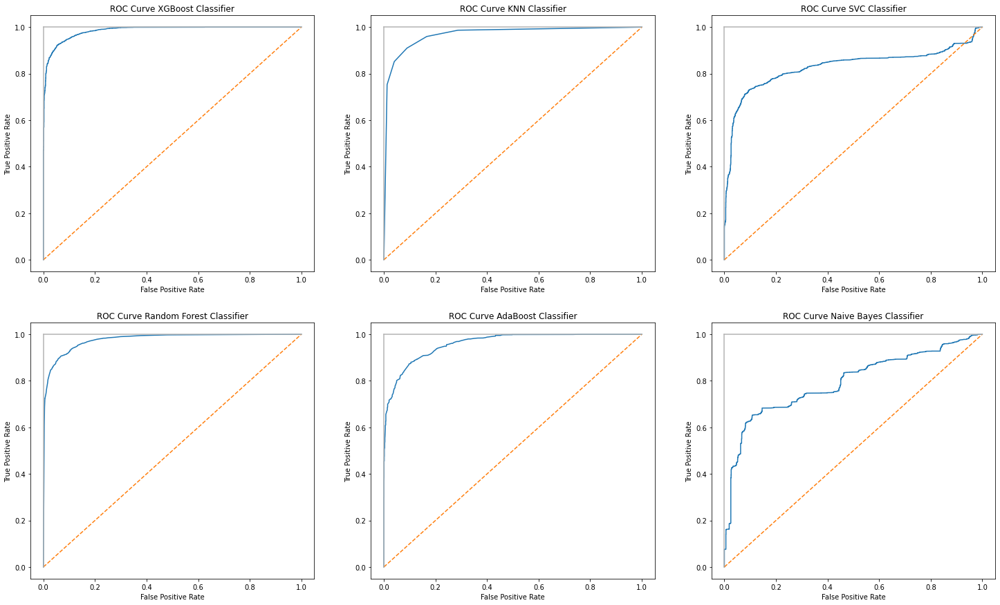

In [79]:
plt.subplots(nrows=2,ncols=3,figsize = (25,15))

figurePos = 1

for idx,(model,name) in enumerate(models):
    plt.subplot(2,3,idx+1)

    y_score = model.predict_proba(X_test)[:,1] 
    
    false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_score)
    
    plt.title(f"ROC Curve {name}")
    
    plt.plot(false_positive_rate, true_positive_rate)
    
    plt.plot([0, 1], ls="--")
    plt.plot([0, 0], [1, 0] , c=".7")
    plt.plot([1, 1] , c=".7")
    
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
plt.show()

#### Проанализируем важность признаков для классификации с помощью XGBoost.
Отметим, также можно сделать анализ важности и с другими алгоритмами на деревьях. Анализ можно проводить как для классификации, так и для регрессии.

[10:55:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


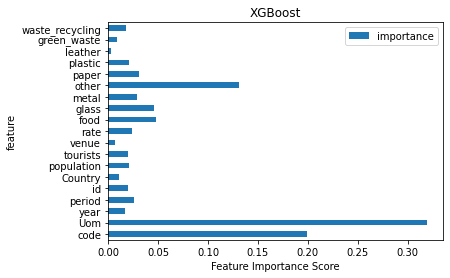

In [50]:
X = df_se.drop(["polution"],axis = 1)
y = df_se["polution"].values 
y_cls = (y>=1.7)*1

X_train, X_test, y_train, y_test = train_test_split(X,y_cls,test_size = 0.3, random_state = 42)

scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

features = X.columns

model = xg.XGBClassifier()
model.fit(X_train,y_train)

feat_imp = pd.DataFrame({'importance':model.feature_importances_}) 

feat_imp['feature'] = features

feat_imp = feat_imp.set_index('feature', drop=True)

feat_imp.plot.barh(title="XGBoost")

plt.xlabel('Feature Importance Score')

plt.show()

### Вопрос: 
<b>Назовите самый важный признок?
 

### Вопрос: 
<b>Назовите самый неважный признок?
